# **Necessary Libs**

In [1]:
import os  # when loading file paths
import pandas as pd  # for lookup in annotation file
import spacy  # for tokenizer
import torch
from torch.nn.utils.rnn import pad_sequence  # pad batch
from torch.utils.data import DataLoader, Dataset
from PIL import Image  # Load img
import torchvision.transforms as transforms
from torchtext.data import Field, TabularDataset, BucketIterator
from sklearn.model_selection import train_test_split
import string
import numpy as np
from torch import nn
from torch.autograd import Variable
from torchvision import datasets, models, transforms
import torchvision
import torch.optim as optim
import matplotlib.pyplot as plt
import nltk
import torchvision.transforms as tfs

In [2]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

# **Utilities**

In [3]:
def myTokenize(text):
    return nltk.word_tokenize(text)
def buildVocab(path):
  capt = Field(sequential=True, init_token='<SOS>', eos_token='<EOS>', pad_token='<PAD>', unk_token='<UNK>',
                use_vocab=True, tokenize=myTokenize, lower=True)
  fields = {"caption": ("q", capt)}
  train_data = TabularDataset(path=path, format="csv", fields=fields)
  capt.build_vocab(train_data, max_size=10000, min_freq=1)
  return capt.vocab
def numericalize(text, vocab):
    tokenized_text = myTokenize(text)
    return [vocab.stoi[token] if token in vocab.stoi else vocab.stoi["<UNK>"] for token in tokenized_text]
def captionToInd(caption, vocab):
  return  [vocab.stoi["<SOS>"]] +  numericalize(caption, vocab) + [vocab.stoi["<EOS>"]]

# **Data Loader**

In [4]:
class ImgCaptioningDataset(Dataset):
  def __init__(self, dataFrame, fileName, root, vocab, transform = None):
    self.imgCaption = dataFrame
    self.transform = transform
    self.root = root
    self.vocab = vocab
  def __getitem__(self, idx):
    if torch.is_tensor(idx):
            idx = idx.tolist()
    imgName = os.path.join(self.root, self.imgCaption.iloc[idx, 0])
    imgSample =  Image.open(imgName).convert("RGB")
    if self.transform:
      imgSample = self.transform(imgSample)
    caption = self.imgCaption["caption"].iloc[idx]
    captionInd = captionToInd(caption = caption, vocab = self.vocab)
    return imgSample, torch.tensor(captionInd)
  def __len__(self):
    return len(self.imgCaption)


# **Vocabulary, Train/Test Loader**

In [5]:
#myDir = '/content/drive/MyDrive/Hw3/P1/Sample.txt'
myDir = '../input/flickr8k/captions.txt'
myRootImg = '../input/flickr8k/Images'
#myFileName = 'Sample.txt'
myFileName = 'captions.txt'
transform =transforms.Compose(
        [
            transforms.Resize((356, 356)),
            transforms.RandomCrop((299, 299)),
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        ]
   )
vocab  = buildVocab(path = myDir)


/opt/conda/lib/python3.7/site-packages/torchtext/data/field.py:150: UserWarning: Field class will be retired soon and moved to torchtext.legacy. Please see the most recent release notes for further information.
  warnings.warn('{} class will be retired soon and moved to torchtext.legacy. Please see the most recent release notes for further information.'.format(self.__class__.__name__), UserWarning)
/opt/conda/lib/python3.7/site-packages/torchtext/data/example.py:68: UserWarning: Example class will be retired soon and moved to torchtext.legacy. Please see the most recent release notes for further information.
  warnings.warn('Example class will be retired soon and moved to torchtext.legacy. Please see the most recent release notes for further information.', UserWarning)
/opt/conda/lib/python3.7/site-packages/torchtext/data/example.py:52: UserWarning: Example class will be retired soon and moved to torchtext.legacy. Please see the most recent release notes for further information.
  warn

In [6]:
def splitTrainTestImgs(myDataFrame, testSize):
  trainDataInd = []
  testDataInd = []
  imgNumbers = int(len(myDataFrame)/5)
  imgaesInd = list(range(0, imgNumbers))
  trainInd, testInd = train_test_split(imgaesInd, test_size=testSize)
  for cnt in range(5):
    trainDataInd += list(np.asarray(trainInd)*5 + cnt)
    testDataInd += list(np.asarray(testInd)*5 + cnt)
  trainDataFrame, testDataFrame = myDataFrame.iloc[trainDataInd], myDataFrame.iloc[testDataInd]
  return trainDataFrame, testDataFrame

In [7]:
myDataFrame = pd.read_csv(myDir)
for punc in string.punctuation+'\n':
      myDataFrame["caption"] = myDataFrame.caption.str.replace(punc, "")
myDataFrame["caption"] = myDataFrame.caption.str.lower()
#trainDataFrame, testDataFrame = train_test_split(myDataFrame, test_size=0.2)
trainDataFrame, testDataFrame = splitTrainTestImgs(myDataFrame = myDataFrame, testSize = 0.05)

trainDataset = ImgCaptioningDataset(dataFrame = trainDataFrame, fileName = myFileName, root = myRootImg,
                                    transform = transform, vocab = vocab)
testDataset = ImgCaptioningDataset(dataFrame = testDataFrame, fileName = myFileName, root = myRootImg,
                                   transform = transform, vocab = vocab)

In [8]:
#https://github.com/aladdinpersson/Machine-Learning-Collection/blob/master/ML/Pytorch/more_advanced/image_captioning/get_loader.py
class MyCollate:
    def __init__(self, pad_idx):
        self.pad_idx = pad_idx
    def __call__(self, batch):
        imgs = [item[0].unsqueeze(0) for item in batch]
        imgs = torch.cat(imgs, dim=0)
        targets = [item[1] for item in batch]
        targets = pad_sequence(targets, batch_first=False, padding_value=self.pad_idx)
        return imgs, targets

In [9]:

pad_idx = trainDataset.vocab.stoi['<PAD>']

In [10]:
trainImgCaptData = DataLoader(trainDataset, batch_size=256, shuffle=True, num_workers=1,  pin_memory=True,
  collate_fn=MyCollate(pad_idx=pad_idx))

testImgCaptData = DataLoader(testDataset, batch_size=256, shuffle=True, num_workers=1,  pin_memory=True,
  collate_fn=MyCollate(pad_idx=pad_idx))

# **Models**

In [11]:
class CNN_Resnet18(nn.Module):
    def __init__(self, fineTune, embeddingSize):
      super(CNN_Resnet18, self).__init__()
      self.modelConv = torchvision.models.resnet18(pretrained = True)
      if not fineTune:
        for param in self.modelConv.parameters():
          param.requires_grad = False
      numFtrs = self.modelConv.fc.in_features
      self.modelConv.fc = nn.Linear(numFtrs, embeddingSize)
      self.relu = nn.ReLU()
      self.dropout = nn.Dropout(0.5)
    def forward(self, img):
      imgFeatures = self.modelConv(img)
      return self.dropout(self.relu(imgFeatures))

In [12]:
class ImgCaptNet(nn.Module):
  def __init__(self, fineTune, embeddingDim, hiddenDim, vocabLen):
    super(ImgCaptNet, self).__init__()
    self.cnnNet = CNN_Resnet18(fineTune, embeddingDim)
    self.embedding = nn.Embedding(vocabLen, embeddingDim, max_norm=True)  #Parameters are true?
    self.lstm = nn.LSTM(embeddingDim, hiddenDim)
    self.linear = nn.Linear(in_features = hiddenDim, out_features = vocabLen)
    self.dropout = nn.Dropout(0.5)
  def forward(self, img, caption):
    captEmbd =  self.dropout(self.embedding(caption))
    imgFeatures = self.cnnNet(img)
    features = torch.cat((imgFeatures.unsqueeze(0), captEmbd), 0)
    h, (hn, cn) = self.lstm(features)
    outputs = self.linear(h)
    return outputs
  def imgCapt(self, img, vocab, maxLength):
    with torch.no_grad():
      inputData = self.cnnNet(img).unsqueeze(0)
      captionPred = []
      states = None
      for i in range(maxLength):
        hid, states = self.lstm(inputData, states)
        outPut = self.linear(hid.squeeze(0))
        predInd = outPut.argmax(1)
        inputData = self.embedding(predInd).unsqueeze(0)
        captionPred.append(predInd)
        if vocab.itos[predInd.item()] == "<EOS>":
          break
    return [vocab.itos[ind] for ind in captionPred]

# **Train Model**

In [13]:
def plotLoss(epoch, trainLoss):
  plt.xlabel('Epoch')
  plt.ylabel('Cross Entropy Loss')
  plt.title('Loss')
  plt.plot(epoch, trainLoss, label='Train')
  plt.legend(loc='upper left')
  plt.show()

In [14]:
def calcTestLoss(testloader, net, criterion):
  totalLoss = 0; i = 0
  net.eval()
  with torch.no_grad():
    for imgSample,  caption in testloader:
      if torch.cuda.is_available:
        imgSample = imgSample.cuda()
        caption =  caption.cuda()
      i +=1
      outputs = net(imgSample, caption[0:caption.shape[0]-1])
      loss = criterion(outputs.reshape(-1, outputs.shape[2]), caption.reshape(-1))
      totalLoss += loss.item()
  avgLoss = totalLoss/i
  return avgLoss

In [15]:
def showResults(epoch ,testloader, net):
  cnt = 0
  trans = tfs.Compose([
          tfs.ToTensor(),
          tfs.Normalize([-0.5, -0.5, -0.5], [2, 2, 2])
      ])
  fig, axs = plt.subplots(1, 3, figsize=(15,5))
  for imgSample, caption in testloader:
    if torch.cuda.is_available:
        imgSample = imgSample.cuda()
        caption =  caption.cuda()
    captionPred = net.imgCapt(imgSample[0].unsqueeze(0), trainDataset.vocab, 50)
    origImg = trans(imgSample[0].cpu().numpy().transpose([1,2,0]))
    fig.suptitle('Epoch %d'%epoch)
    axs[cnt].imshow(origImg.numpy().transpose([1,2,0]))
    axs[cnt].set_title("figure: "+ str(cnt+1))
    print("Figure"+str(cnt+1)+": ",captionPred)
    cnt +=1
    if cnt ==3:
      break
  plt.show()

In [16]:
fineTune = True
embeddingDim = 300
hiddenDim = 256
vocabLen = len(trainDataset.vocab)
learningRate = 3e-4
numEpochs = 40

In [17]:
net = ImgCaptNet(fineTune, embeddingDim, hiddenDim, vocabLen)
if torch.cuda.is_available():
    net = net.cuda()
criterion = nn.CrossEntropyLoss(ignore_index=trainDataset.vocab.stoi["<PAD>"])
optimizer = optim.Adam(net.parameters(), lr=learningRate)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

In [18]:
lossTrainHist = []
lossTestHist = []
epochHist = []

****************** Epoch: 1  ******************


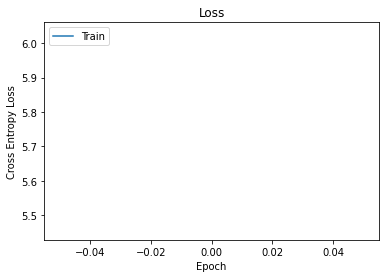

Figure1:  ['<SOS>', 'a', 'a', 'a', 'a', 'a', 'a', '<EOS>']
Figure2:  ['<SOS>', 'a', 'a', 'a', 'a', 'a', 'a', '<EOS>']
Figure3:  ['<SOS>', 'a', 'a', 'a', 'a', 'a', 'a', '<EOS>']


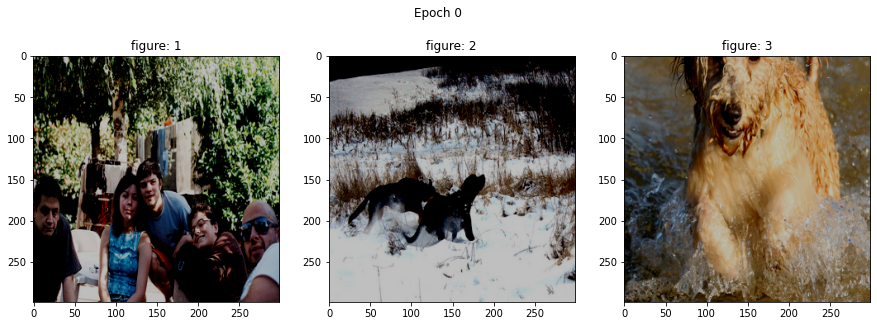

Test Loss: 4.782096266746521
****************** Epoch: 2  ******************


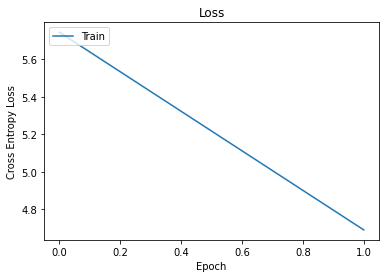

Figure1:  ['<SOS>', 'a', 'man', 'in', 'a', 'in', 'a', '<EOS>']
Figure2:  ['<SOS>', 'a', 'man', 'in', 'a', 'in', 'a', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'in', 'a', 'in', 'a', '<EOS>']


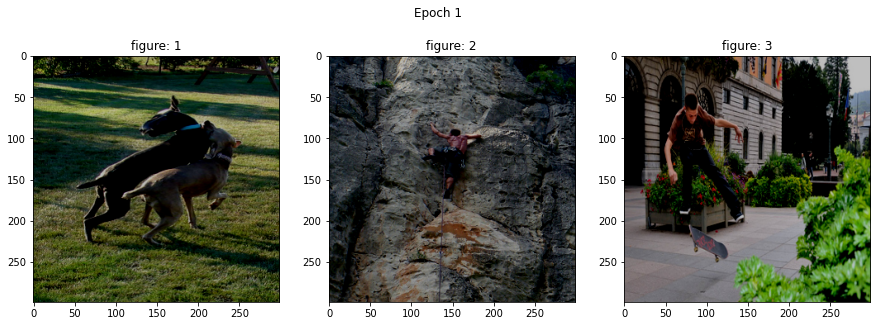

Test Loss: 4.553984999656677
****************** Epoch: 3  ******************


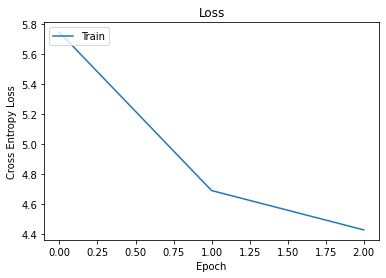

Figure1:  ['<SOS>', 'a', 'man', 'in', 'a', 'in', 'a', 'in', 'a', '<EOS>']
Figure2:  ['<SOS>', 'a', 'man', 'in', 'a', 'in', 'a', 'in', 'a', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'in', 'a', 'in', 'a', 'in', 'a', '<EOS>']


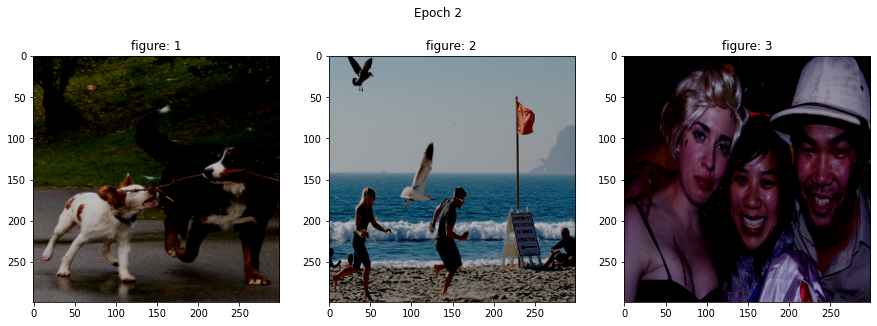

Test Loss: 4.280486702919006
****************** Epoch: 4  ******************


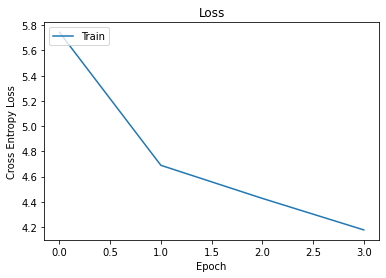

Figure1:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'is', 'is', 'in', 'a', 'red', 'and', 'a', 'dog', 'in', 'a', 'red', '<EOS>']
Figure2:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'is', 'is', 'in', 'a', 'red', 'and', 'a', 'dog', 'in', 'a', 'red', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'is', 'is', 'in', 'a', 'red', 'and', 'a', 'dog', 'in', 'a', 'red', '<EOS>']


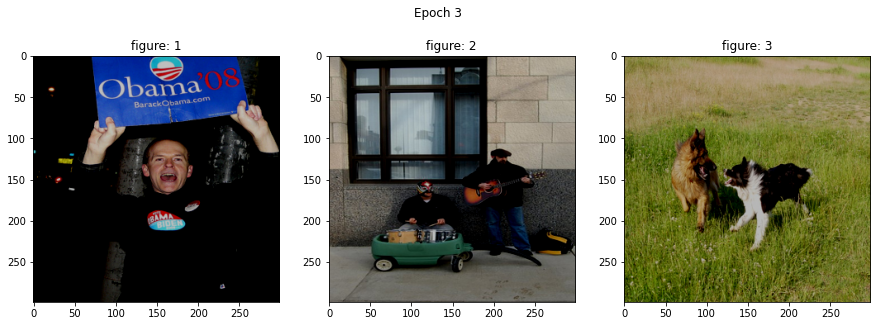

Test Loss: 4.058378875255585
****************** Epoch: 5  ******************


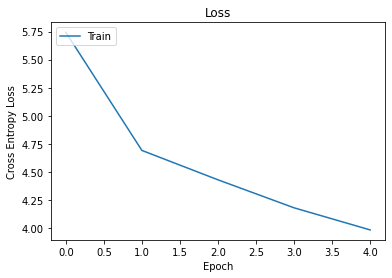

Figure1:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'is', 'is', 'is', 'is', 'in', 'a', 'red', 'and', 'a', 'dog', 'in', 'a', 'red', '<EOS>']
Figure2:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'is', 'is', 'is', 'is', 'in', 'a', 'red', 'and', 'a', 'dog', 'in', 'a', 'red', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'is', 'is', 'is', 'is', 'in', 'a', 'red', 'and', 'a', 'dog', 'in', 'a', 'red', '<EOS>']


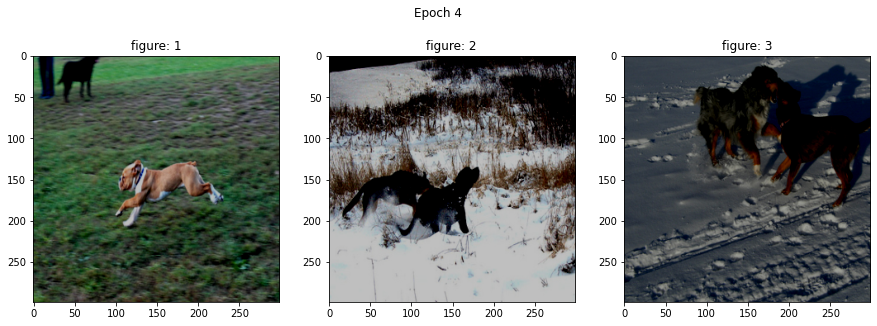

Test Loss: 3.900865077972412
****************** Epoch: 6  ******************


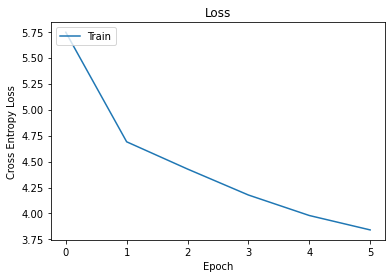

Figure1:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'is', 'is', 'is', 'on', 'a', 'red', 'ball', '<EOS>']
Figure2:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'is', 'is', 'is', 'on', 'a', 'red', 'ball', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'is', 'is', 'is', 'on', 'a', 'red', 'ball', '<EOS>']


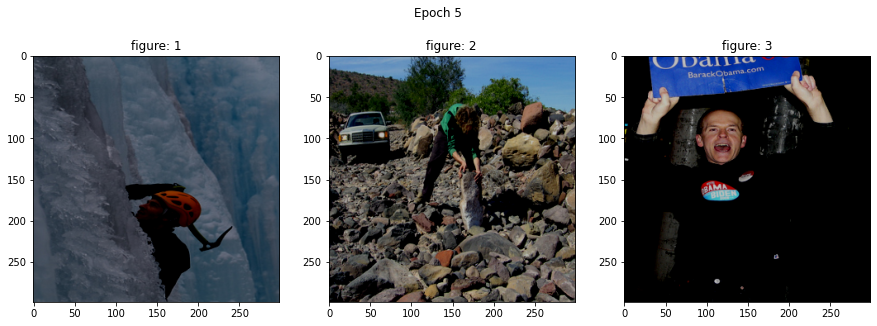

Test Loss: 3.7883048355579376
****************** Epoch: 7  ******************


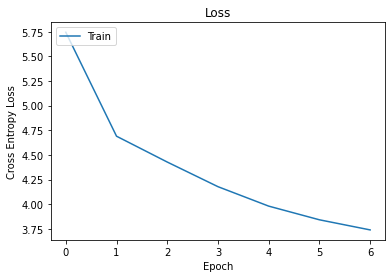

Figure1:  ['<SOS>', 'a', 'man', 'is', 'running', 'on', 'a', 'water', '<EOS>']
Figure2:  ['<SOS>', 'a', 'man', 'is', 'running', 'on', 'a', 'water', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'is', 'running', 'on', 'a', 'water', '<EOS>']


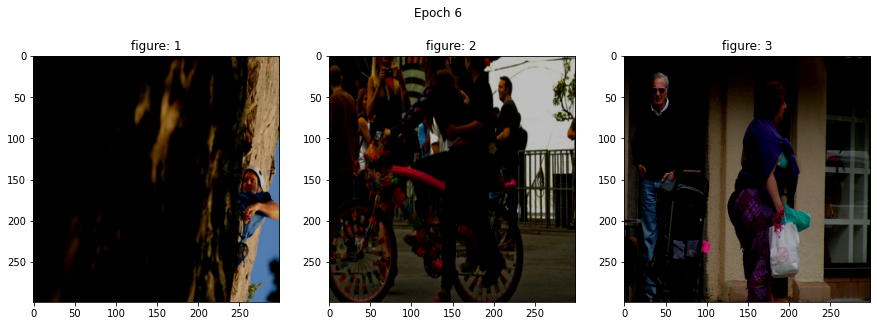

Test Loss: 3.70490226149559
****************** Epoch: 8  ******************


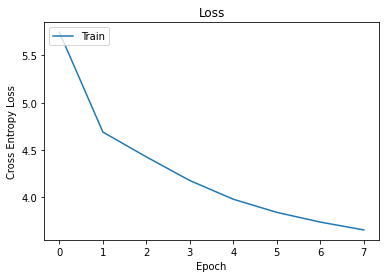

Figure1:  ['<SOS>', 'a', 'man', 'is', 'running', 'on', 'a', 'water', '<EOS>']
Figure2:  ['<SOS>', 'a', 'man', 'is', 'running', 'on', 'a', 'water', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'is', 'running', 'on', 'a', 'water', '<EOS>']


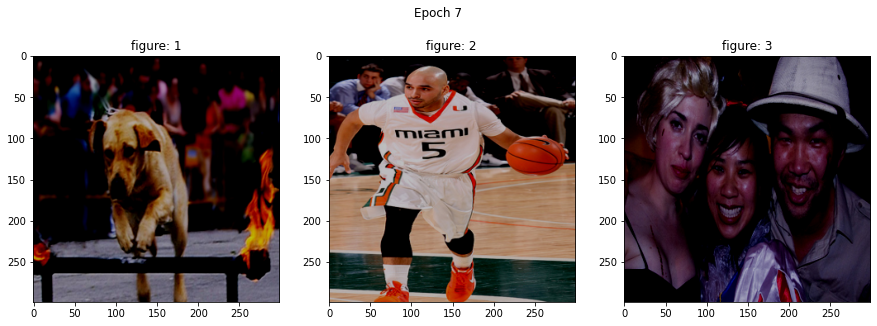

Test Loss: 3.635035365819931
****************** Epoch: 9  ******************


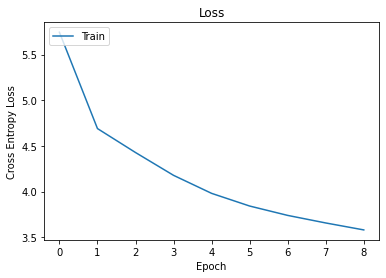

Figure1:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'is', 'is', 'standing', 'on', 'a', 'water', '<EOS>']
Figure2:  ['<SOS>', 'a', 'dog', 'is', 'running', 'on', 'a', 'water', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'is', 'is', 'standing', 'on', 'a', 'water', '<EOS>']


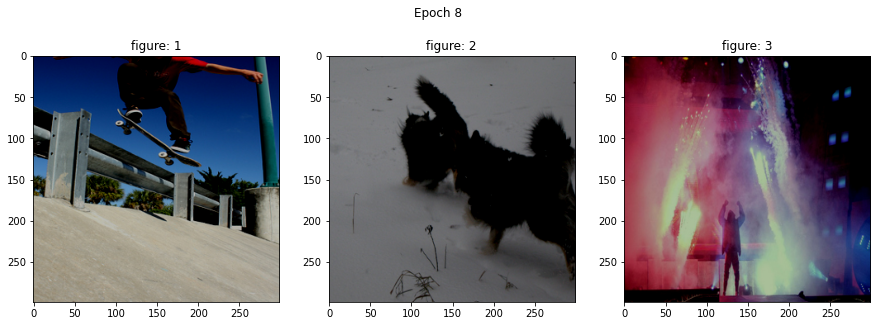

Test Loss: 3.5683006942272186
****************** Epoch: 10  ******************


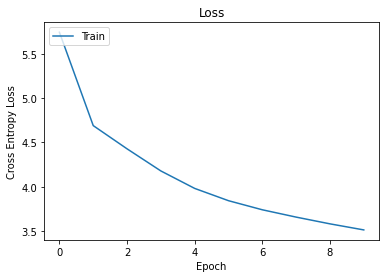

Figure1:  ['<SOS>', 'a', 'dog', 'is', 'running', 'on', 'a', 'water', '<EOS>']
Figure2:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'is', 'standing', 'on', 'a', 'water', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'is', 'standing', 'on', 'a', 'water', '<EOS>']


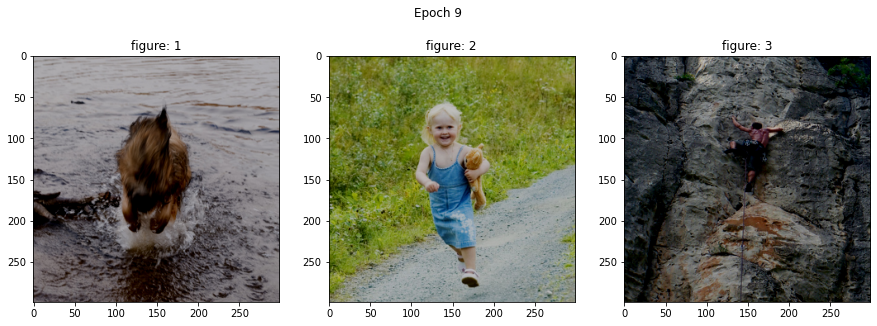

Test Loss: 3.506062000989914
****************** Epoch: 11  ******************


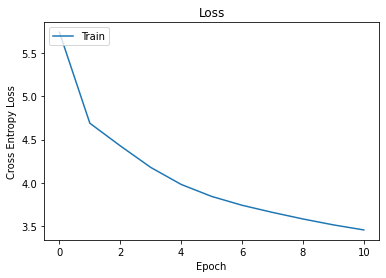

Figure1:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'rock', '<EOS>']
Figure2:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'rock', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'rock', '<EOS>']


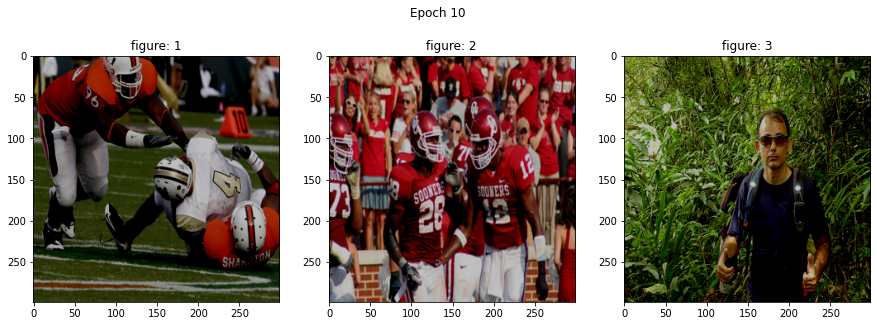

Test Loss: 3.466013938188553
****************** Epoch: 12  ******************


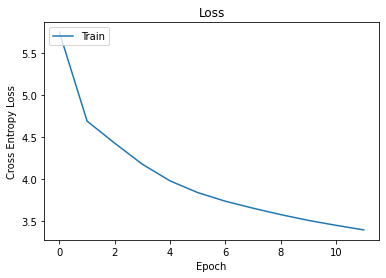

Figure1:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'rock', '<EOS>']
Figure2:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'rock', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'jumping', 'on', 'a', 'rock', '<EOS>']


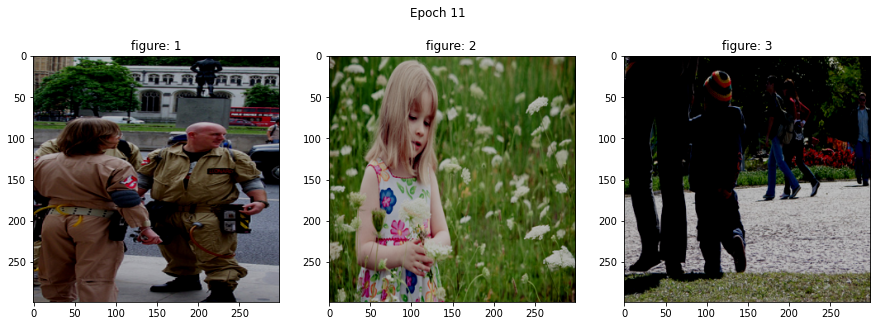

Test Loss: 3.424584150314331
****************** Epoch: 13  ******************


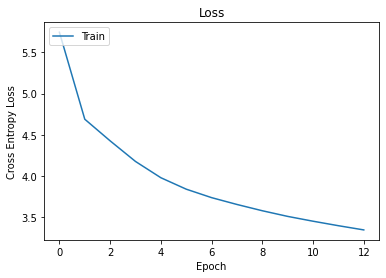

Figure1:  ['<SOS>', 'a', 'man', 'in', 'a', 'blue', 'shirt', 'is', 'standing', 'on', 'a', 'rock', '<EOS>']
Figure2:  ['<SOS>', 'a', 'man', 'is', 'jumping', 'on', 'a', 'rock', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'is', 'jumping', 'on', 'a', 'rock', '<EOS>']


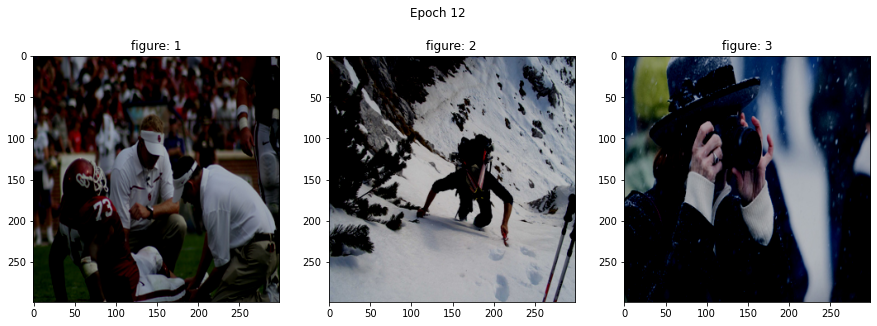

Test Loss: 3.3807857036590576
****************** Epoch: 14  ******************


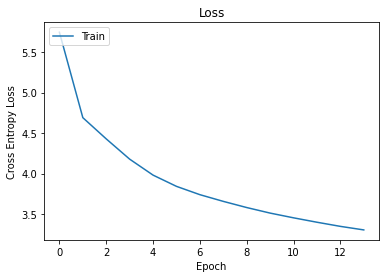

Figure1:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'rock', '<EOS>']
Figure2:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'rock', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'rock', '<EOS>']


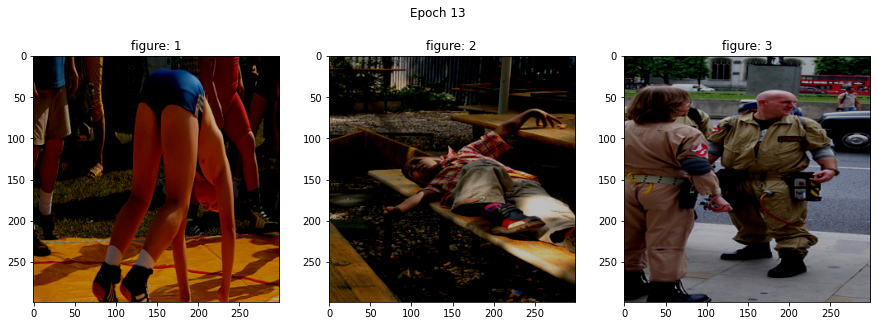

Test Loss: 3.348074197769165
****************** Epoch: 15  ******************


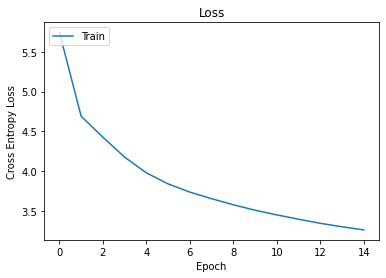

Figure1:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'rock', '<EOS>']
Figure2:  ['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'grass', '<EOS>']
Figure3:  ['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'grass', '<EOS>']


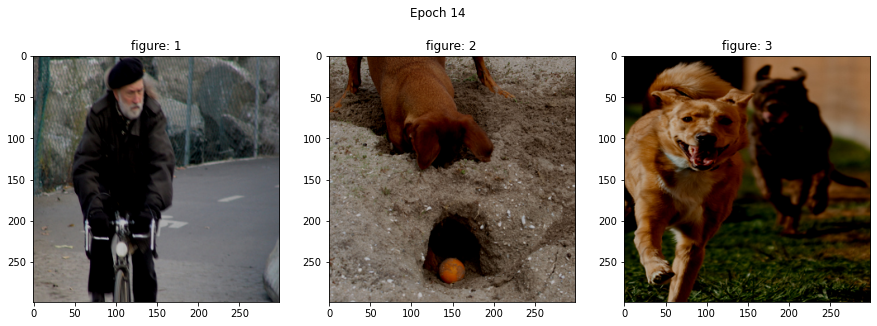

Test Loss: 3.3192010819911957
****************** Epoch: 16  ******************


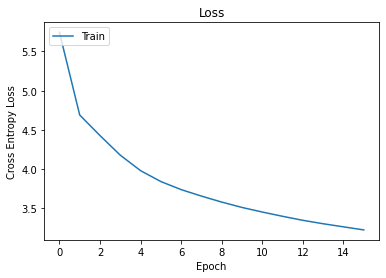

Figure1:  ['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'grass', '<EOS>']
Figure2:  ['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'grass', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'bench', '<EOS>']


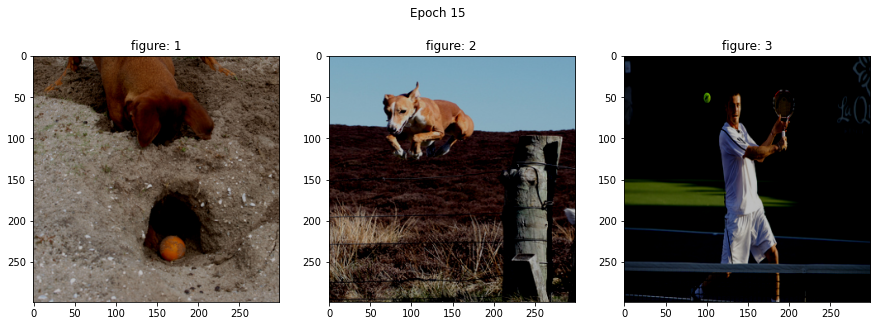

Test Loss: 3.28602996468544
****************** Epoch: 17  ******************


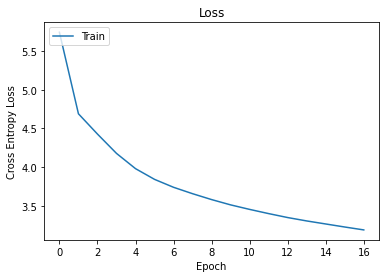

Figure1:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'bench', '<EOS>']
Figure2:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'bench', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'bench', '<EOS>']


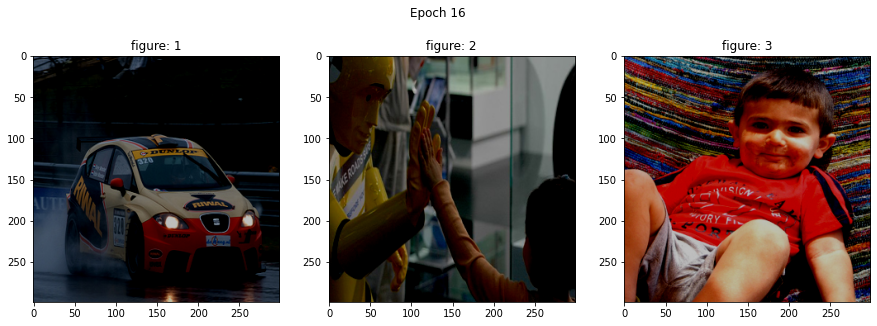

Test Loss: 3.2607230842113495
****************** Epoch: 18  ******************


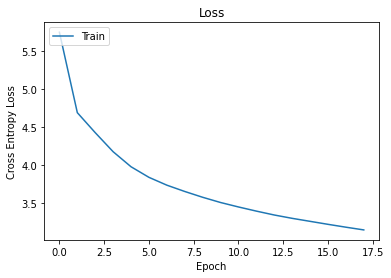

Figure1:  ['<SOS>', 'a', 'man', 'in', 'a', 'blue', 'shirt', 'is', 'jumping', 'on', 'a', 'rock', '<EOS>']
Figure2:  ['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'grass', '<EOS>']
Figure3:  ['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'grass', '<EOS>']


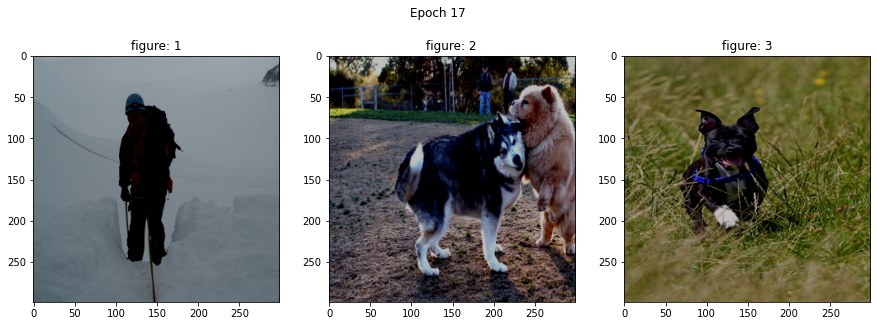

Test Loss: 3.2325256764888763
****************** Epoch: 19  ******************


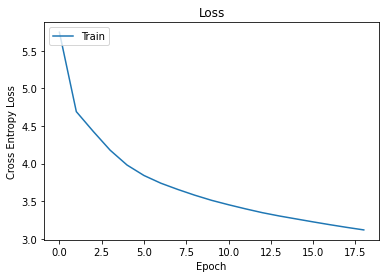

Figure1:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'bench', '<EOS>']
Figure2:  ['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'water', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'and', 'a', 'black', 'shirt', 'is', 'standing', 'on', 'a', 'bench', '<EOS>']


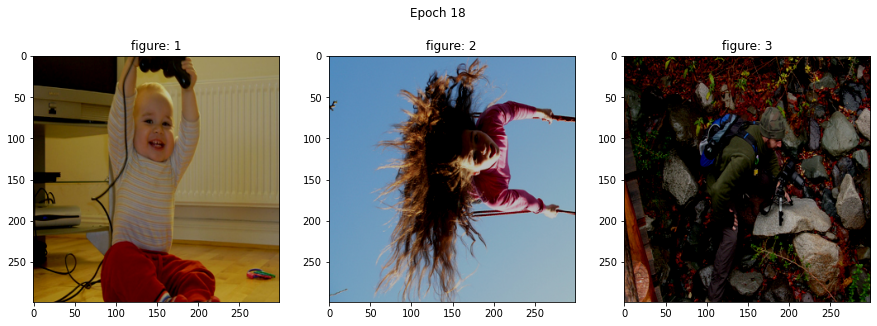

Test Loss: 3.2140020728111267
****************** Epoch: 20  ******************


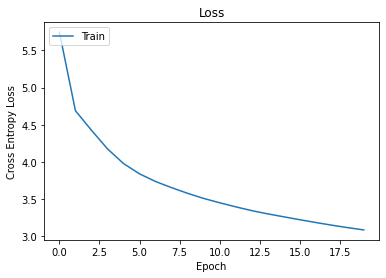

Figure1:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'bench', '<EOS>']
Figure2:  ['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'grass', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'is', 'riding', 'a', 'bike', 'on', 'a', 'ramp', '<EOS>']


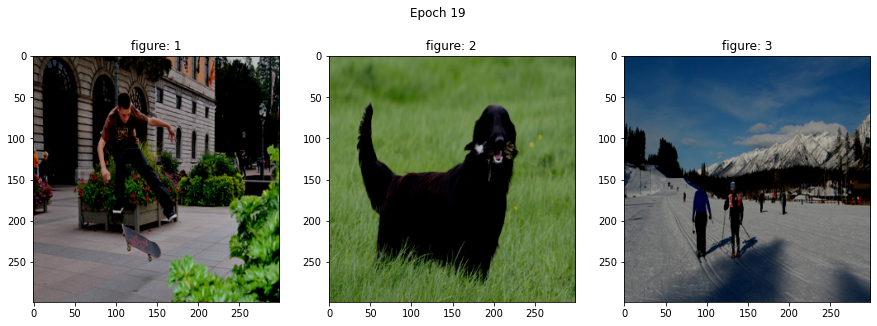

Test Loss: 3.189471274614334
****************** Epoch: 21  ******************


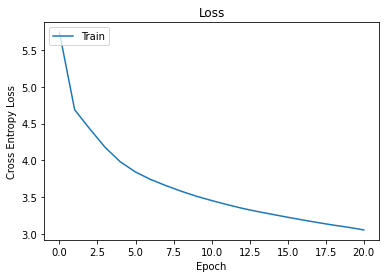

Figure1:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'and', 'a', 'black', 'shirt', 'is', 'standing', 'on', 'a', 'bench', '<EOS>']
Figure2:  ['<SOS>', 'a', 'man', 'in', 'a', 'blue', 'shirt', 'is', 'jumping', 'on', 'a', 'rock', '<EOS>']
Figure3:  ['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'grass', '<EOS>']


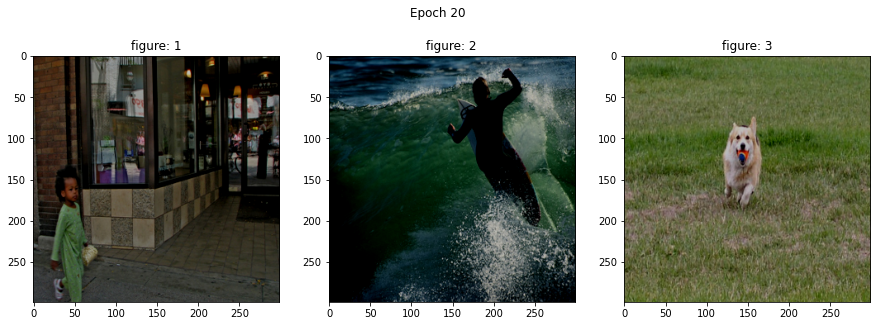

Test Loss: 3.1683148443698883
****************** Epoch: 22  ******************


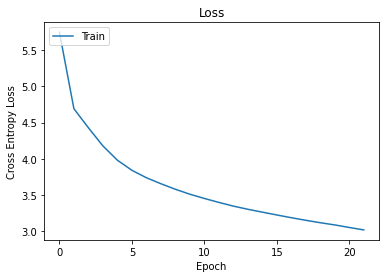

Figure1:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'and', 'a', 'hat', 'is', 'standing', 'on', 'a', 'bench', '<EOS>']
Figure2:  ['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'grass', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'is', 'jumping', 'on', 'a', 'rock', '<EOS>']


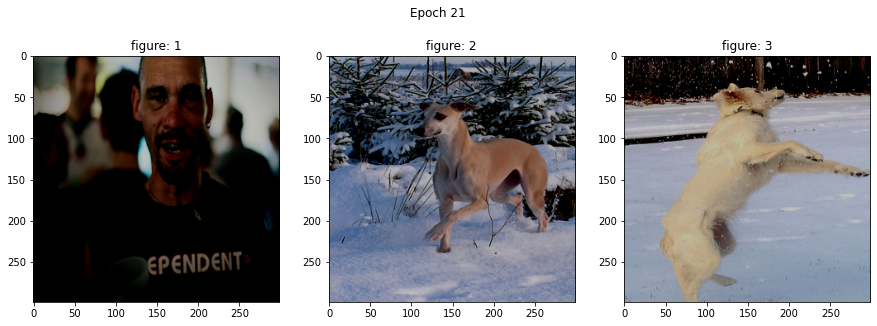

Test Loss: 3.1473508477211
****************** Epoch: 23  ******************


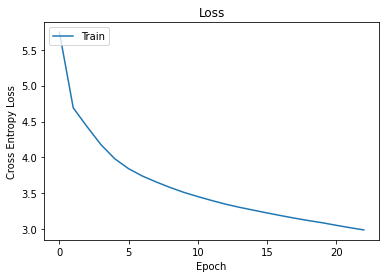

Figure1:  ['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'grass', '<EOS>']
Figure2:  ['<SOS>', 'a', 'young', 'boy', 'in', 'a', 'blue', 'shirt', 'is', 'jumping', 'into', 'the', 'air', '<EOS>']
Figure3:  ['<SOS>', 'a', 'boy', 'in', 'a', 'blue', 'shirt', 'is', 'jumping', 'into', 'the', 'air', '<EOS>']


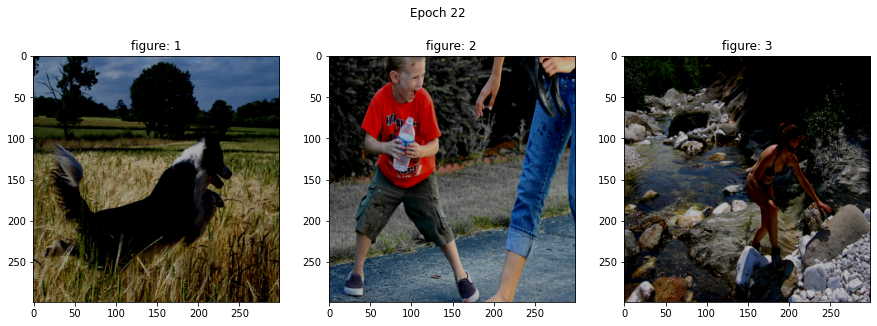

Test Loss: 3.1339436769485474
****************** Epoch: 24  ******************


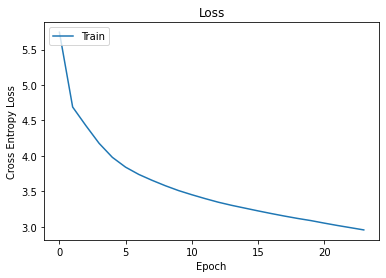

Figure1:  ['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'grass', '<EOS>']
Figure2:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'running', 'on', 'a', 'beach', '<EOS>']
Figure3:  ['<SOS>', 'a', 'group', 'of', 'people', 'are', 'sitting', 'on', 'a', 'bench', '<EOS>']


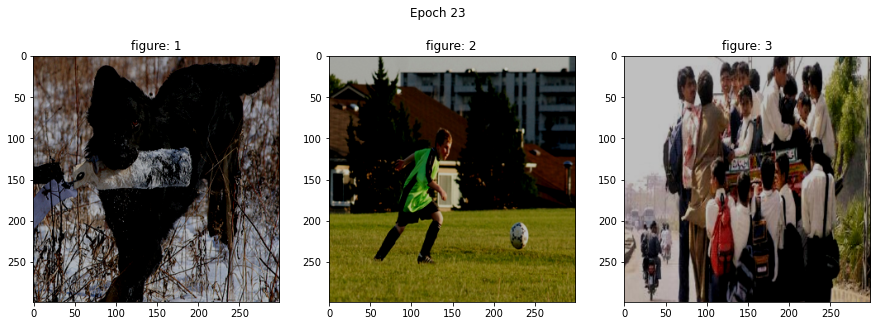

Test Loss: 3.1065767109394073
****************** Epoch: 25  ******************


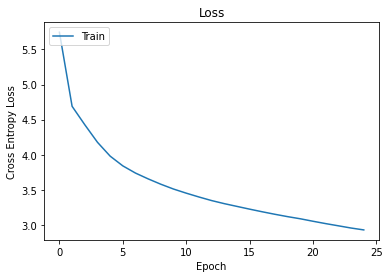

Figure1:  ['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'grass', '<EOS>']
Figure2:  ['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'grass', '<EOS>']
Figure3:  ['<SOS>', 'a', 'group', 'of', 'people', 'are', 'standing', 'on', 'a', 'bench', '<EOS>']


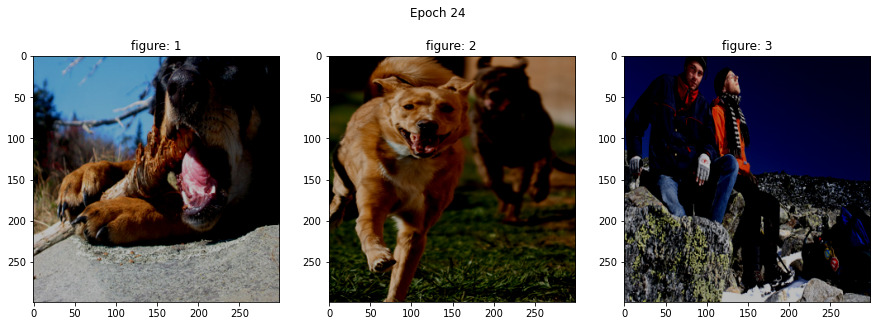

Test Loss: 3.0926627814769745
****************** Epoch: 26  ******************


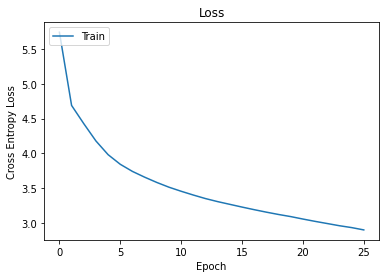

Figure1:  ['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'grass', '<EOS>']
Figure2:  ['<SOS>', 'a', 'woman', 'in', 'a', 'red', 'shirt', 'and', 'a', 'hat', 'is', 'standing', 'in', 'front', 'of', 'a', 'crowd', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'riding', 'a', 'bike', '<EOS>']


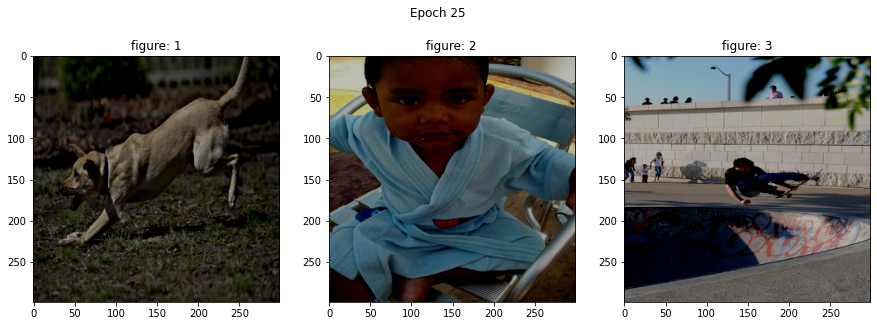

Test Loss: 3.0715934336185455
****************** Epoch: 27  ******************


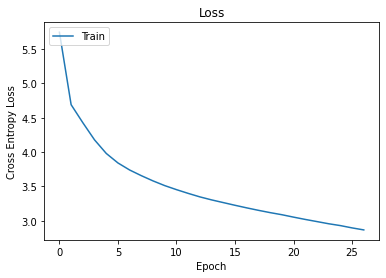

Figure1:  ['<SOS>', 'a', 'group', 'of', 'people', 'are', 'standing', 'on', 'a', 'snowy', 'hill', '<EOS>']
Figure2:  ['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'grass', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'jumping', 'on', 'a', 'rock', '<EOS>']


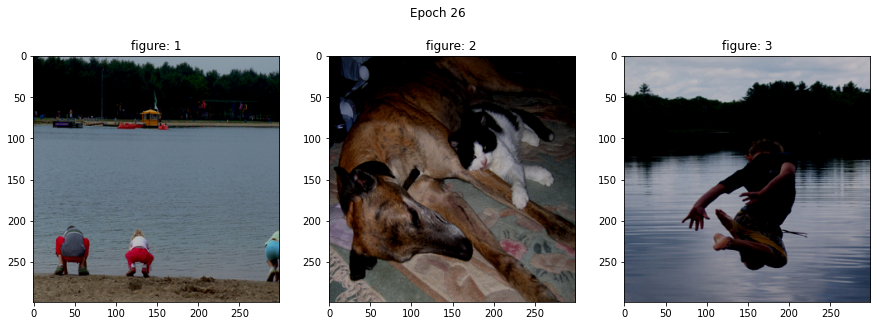

Test Loss: 3.0547684133052826
****************** Epoch: 28  ******************


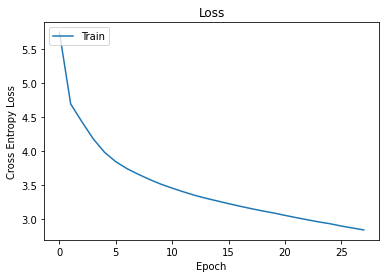

Figure1:  ['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'grass', '<EOS>']
Figure2:  ['<SOS>', 'a', 'young', 'girl', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'bench', '<EOS>']
Figure3:  ['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'bench', '<EOS>']


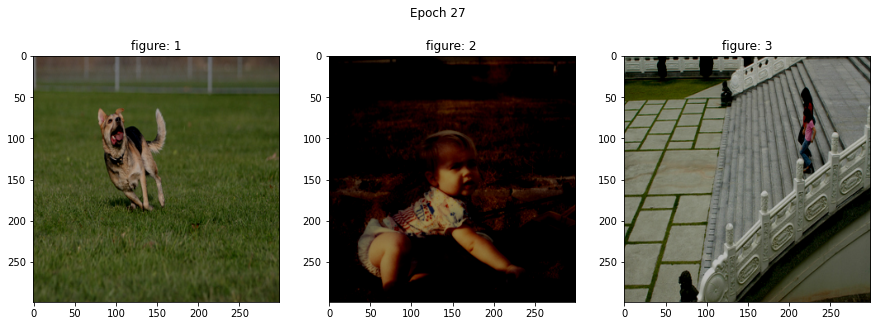

Test Loss: 3.0381688475608826
****************** Epoch: 29  ******************


In [ ]:
for epoch in range(numEpochs):
  net.train()
  stepTrain = 0
  running_loss = 0
  print("****************** Epoch:", epoch+1," ******************")
  for imgSample, caption in trainImgCaptData:
    if torch.cuda.is_available:
      imgSample = Variable(imgSample).cuda()
      caption =  Variable(caption).cuda()
    else:
      imgSample = Variable(imgSample)
      caption = Variable(caption)
    outputs = net(imgSample, caption[0:caption.shape[0]-1])
    loss = criterion(outputs.reshape(-1, outputs.shape[2]), caption.reshape(-1))
    running_loss += loss.item()
    stepTrain += 1
    optimizer.zero_grad()
    loss.backward(loss)
    optimizer.step()
  testLoss = calcTestLoss(testImgCaptData, net, criterion)
  lossTrainHist.append(running_loss/stepTrain)
  epochHist.append(epoch)
  plotLoss(epochHist, lossTrainHist)
  showResults(epoch ,testImgCaptData, net)
  print("Test Loss:", testLoss)